# Predicting Hotel Booking Cancellations

Hotel booking cancellations can have a significant impact on revenue, inventory management, and overall operational efficiency. To mitigate these effects, predicting hotel booking cancellations has become a valuable tool for hotel managers to make informed decisions and optimize their operations.

Furthermore, predicting hotel booking cancellations enables hotels to implement targeted marketing and customer retention strategies. By identifying patterns in cancellations, hotels can tailor their marketing campaigns to specific customer segments that are more likely to cancel.

By analyzing historical data and identifying patterns, hotels can make decisions to optimize revenue, enhance operational efficiency, and improve customer satisfaction.

# Import Python Libraries

In [72]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import f_oneway

import dtreeviz
from yellowbrick.model_selection import FeatureImportances

import matplotlib.pyplot as plt
import category_encoders as ce 
%matplotlib inline
pd.options.display.float_format = '{:.4f}'.format

from ydata_profiling import ProfileReport
import missingno as msno
import plotly.express as px

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.svm import SVC
from sklearn import svm
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.linear_model import PassiveAggressiveClassifier

from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report

# SMOTE
from imblearn.over_sampling import SMOTE

In [2]:
df = pd.read_csv('hotel_booking.csv')

In [3]:
# pip install dtreeviz

In [4]:
# pip install yellowbrick

In [5]:
# pip install ydata-profiling

In [6]:
# pip install missingno

In [7]:
# pip install plotly

In [8]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,Transient,0.0,0,0,Check-Out,2015-07-01,Ernest Barnes,Ernest.Barnes31@outlook.com,669-792-1661,************4322
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,Transient,0.0,0,0,Check-Out,2015-07-01,Andrea Baker,Andrea_Baker94@aol.com,858-637-6955,************9157
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,Transient,75.0,0,0,Check-Out,2015-07-02,Rebecca Parker,Rebecca_Parker@comcast.net,652-885-2745,************3734
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,Transient,75.0,0,0,Check-Out,2015-07-02,Laura Murray,Laura_M@gmail.com,364-656-8427,************5677
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,Transient,98.0,0,1,Check-Out,2015-07-03,Linda Hines,LHines@verizon.com,713-226-5883,************5498


In [8]:
df.tail()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,Transient,96.14,0,0,Check-Out,2017-09-06,Claudia Johnson,Claudia.J@yahoo.com,403-092-5582,************8647
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,Transient,225.43,0,2,Check-Out,2017-09-07,Wesley Aguilar,WAguilar@xfinity.com,238-763-0612,************4333
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,Transient,157.71,0,4,Check-Out,2017-09-07,Mary Morales,Mary_Morales@hotmail.com,395-518-4100,************1821
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,Transient,104.40,0,0,Check-Out,2017-09-07,Caroline Conley MD,MD_Caroline@comcast.net,531-528-1017,************7860
119389,City Hotel,0,205,2017,August,35,29,2,7,2,...,Transient,151.20,0,2,Check-Out,2017-09-07,Ariana Michael,Ariana_M@xfinity.com,422-804-6403,************4482


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 36 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

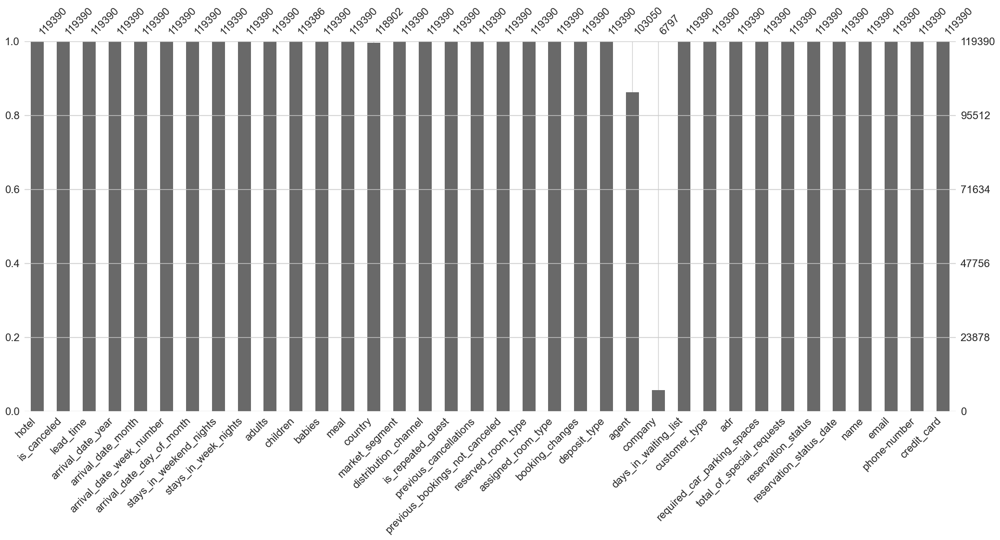

In [10]:
# print('"Agent" & "Company" are irrelevant information for the analysis. These columns will be dropped')
ax = msno.bar(df)

In [11]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [12]:
missing_val_country = (df['country'].isnull().sum() / len(df)) * 100
print('Percentage Missing Values "Country":',missing_val_country)

Percentage Missing Values "Country": 0.40874445095904177


In [13]:
# Removing duplicate rows if any
df.drop_duplicates(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119390 entries, 0 to 119389
Data columns (total 36 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [4]:
print('Total Number of Observations:',df.shape[0])
before_drop = df.shape[1]
print('Total number of attributes before dropping:', before_drop)

Total Number of Observations: 119390
Total number of attributes before dropping: 36


In [5]:
print('Columns before dropping:\n\n', df.columns)

Columns before dropping:

 Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'name', 'email',
       'phone-number', 'credit_card'],
      dtype='object')


In [6]:
# Removing irrelevant, unnecessary and redundant columns.
df.drop(['stays_in_weekend_nights','stays_in_week_nights','adults','children','babies', 'assigned_room_type',
         'agent','company','required_car_parking_spaces','reservation_status_date',
         'name','email','phone-number','credit_card'], axis=1, inplace=True)

In [7]:
print('Total number of attributes before dropping:', before_drop)
print('Total number of attributes after dropping:', df.shape[1])

Total number of attributes before dropping: 36
Total number of attributes after dropping: 22


In [8]:
print('Columns after dropping:\n\n', df.columns)

Columns after dropping:

 Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'meal', 'country', 'market_segment',
       'distribution_channel', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'booking_changes', 'deposit_type', 'days_in_waiting_list',
       'customer_type', 'adr', 'total_of_special_requests',
       'reservation_status'],
      dtype='object')


# EDA

### Guests in Resort Hotel 

In [21]:
years = [2015, 2016, 2017]
hotel_name = 'Resort Hotel'

for year in years:
    filtered_years = df[(df['hotel'] == hotel_name) & (df['arrival_date_year'] == year)]
    months = filtered_years['arrival_date_month'].value_counts()

    print(f'Guests for {hotel_name} in {year}:')
    print(months)
    print() 

Guests for Resort Hotel in 2015:
September    1585
October      1571
August       1409
July         1378
December     1266
November     1105
Name: arrival_date_month, dtype: int64

Guests for Resort Hotel in 2016:
October      1984
April        1867
May          1802
March        1778
August       1685
September    1523
February     1520
July         1441
December     1382
June         1369
November     1332
January       884
Name: arrival_date_month, dtype: int64

Guests for Resort Hotel in 2017:
August      1800
May         1757
July        1754
April       1742
June        1676
February    1583
March       1558
January     1309
Name: arrival_date_month, dtype: int64



### Guests in City Hotel 

In [23]:
years = [2015, 2016, 2017]
hotel_name = 'City Hotel'

for year in years:
    filtered_years = df[(df['hotel'] == hotel_name) & (df['arrival_date_year'] == year)]
    months = filtered_years['arrival_date_month'].value_counts()

    print(f'Guests for {hotel_name} in {year}:')
    print(months)
    print() 

Guests for City Hotel in 2015:
September    3529
October      3386
August       2480
December     1654
July         1398
November     1235
Name: arrival_date_month, dtype: int64

Guests for City Hotel in 2016:
October      4219
June         3923
September    3871
May          3676
April        3561
August       3378
July         3131
November     3122
March        3046
December     2478
February     2371
January      1364
Name: arrival_date_month, dtype: int64

Guests for City Hotel in 2017:
May         4556
June        3971
April       3919
July        3559
March       3412
August      3125
February    2594
January     2372
Name: arrival_date_month, dtype: int64



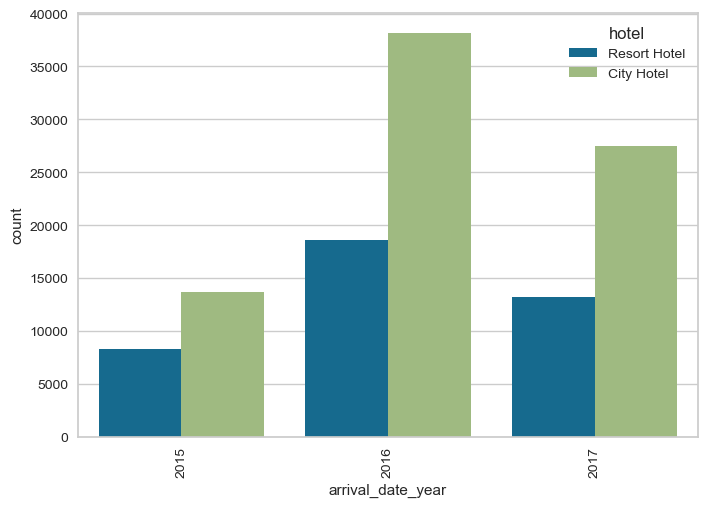

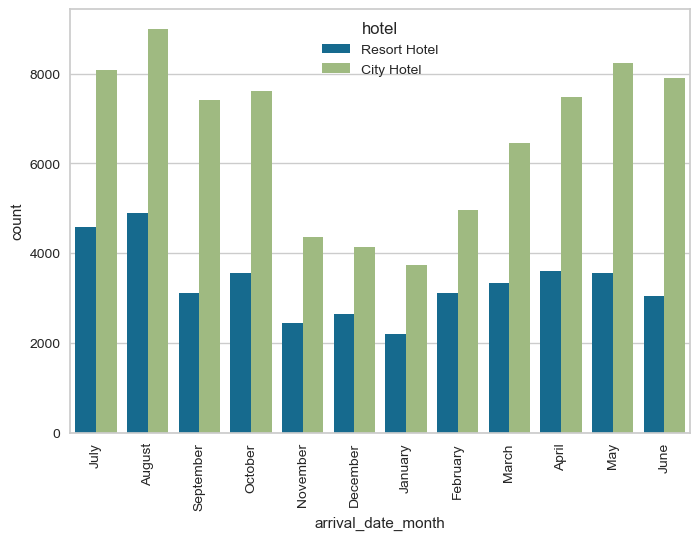

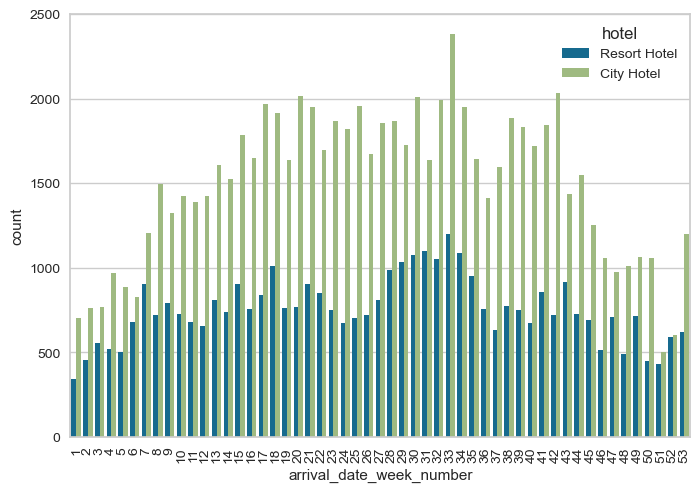

In [24]:
sns.countplot(x='arrival_date_year', hue='hotel', data=df)
plt.xticks(rotation=90)
plt.show();

sns.countplot(x='arrival_date_month', hue='hotel', data=df)
plt.xticks(rotation=90)
plt.show();

sns.countplot(x='arrival_date_week_number', hue='hotel', data=df)
plt.xticks(rotation=90)
plt.show();

### Guests in Resort Hotel and City Hotel

In [25]:
years = [2015, 2016, 2017]

for year in years:
    filtered_years = df[df['arrival_date_year'] == year]
    months = filtered_years['arrival_date_month'].value_counts()

    print(f'Guests for each Month in {year}:')
    print(months)
    print() 

Guests for each Month in 2015:
September    5114
October      4957
August       3889
December     2920
July         2776
November     2340
Name: arrival_date_month, dtype: int64

Guests for each Month in 2016:
October      6203
May          5478
April        5428
September    5394
June         5292
August       5063
March        4824
July         4572
November     4454
February     3891
December     3860
January      2248
Name: arrival_date_month, dtype: int64

Guests for each Month in 2017:
May         6313
April       5661
June        5647
July        5313
March       4970
August      4925
February    4177
January     3681
Name: arrival_date_month, dtype: int64



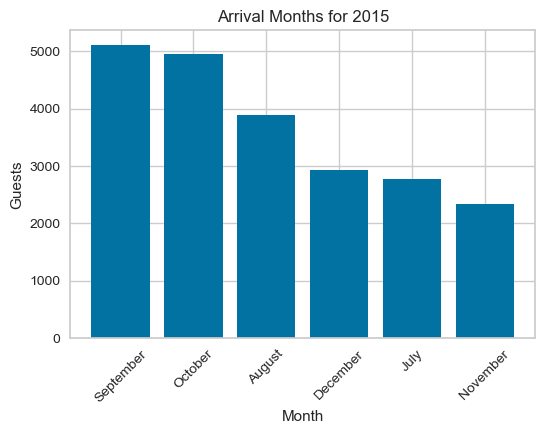

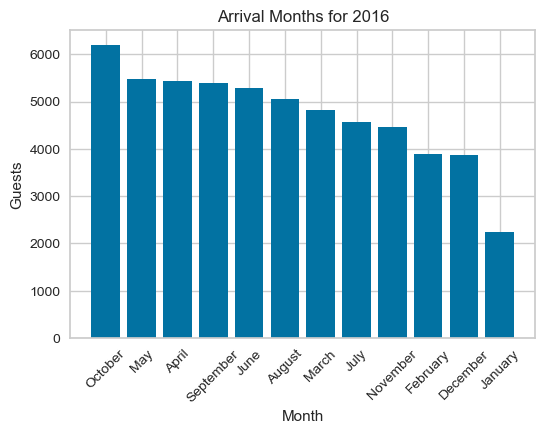

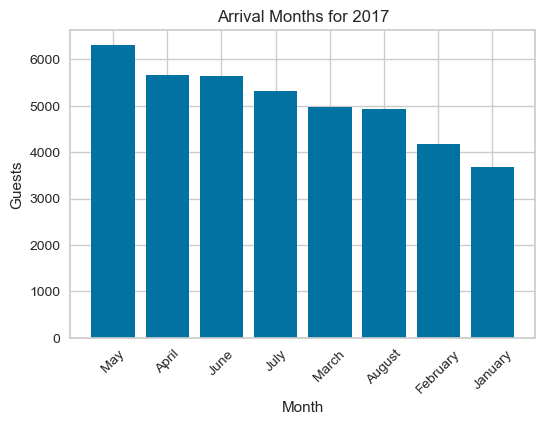

In [26]:
years = [2015, 2016, 2017]

for year in years:
    filtered_years = df[df['arrival_date_year'] == year]
    months = filtered_years['arrival_date_month'].value_counts()

    # Creating the bar chart
    plt.figure(figsize=(6, 4))
    plt.bar(months.index, months.values)
    plt.xlabel('Month')
    plt.ylabel('Guests')
    plt.title(f'Arrival Months for {year}')
    plt.xticks(rotation=45)
    plt.show()

### How does the price vary per night over the year?

In [49]:
data_resort = df[(df['hotel'] == 'Resort Hotel') & (df['is_canceled'] == 0)]
data_city = df[(df['hotel'] == 'City Hotel') & (df['is_canceled'] == 0)]

#### ADR per Month & Year Resort Hotel

In [56]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
resort_hotel

,arrival_date_month,adr
0,April,75.87
1,August,181.21
2,December,68.32
3,February,54.15
4,January,48.71
5,July,150.12
6,June,107.92
7,March,57.01
8,May,76.66
9,November,48.68


In [67]:
resort_hotel = data_resort.groupby(['arrival_date_year'])['adr'].mean().reset_index()
resort_hotel

,arrival_date_year,adr
0,2015,89.76
1,2016,83.91
2,2017,101.77


#### ADR per Month & Year City Hotel

In [88]:
city_hotel=data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,111.86
1,August,118.41
2,December,87.86
3,February,86.18
4,January,82.16
5,July,115.56
6,June,117.70
7,March,90.17
8,May,120.45
9,November,86.50


#### ADR per Month Resort Hotel

In [86]:
city_hotel=data_city.groupby(['arrival_date_year'])['adr'].mean().reset_index()
city_hotel

,arrival_date_year,adr
0,2015,87.87
1,2016,104.08
2,2017,116.82


# Defining the problem statement:
An organization wants to predict who possible defaulters are for the consumer loans product.
Create a Predictive model which can tell whether a client will be risky or not based on his/her personal information.

    Target Variable: is_canceled 
    Predictors: 
    
    Booking NOT Cancelled = 0 
    Booking     Cancelled = 1    
    
    
## Determining the type of Machine Learning

    Based on the problem statement you can understand that we need to create a supervised ML Classification model, as the       target variable is Continuous.

## Looking at the distribution of Target variable

    If target variable's distribution is too skewed then the predictive modeling will not be possible.
    Bell curve is desirable but slightly positive skew or negative skew is also fine
    When performing Classification, make sure the histogram looks like a bell curve or slight skewed version of it.         Otherwise it impacts the Machine Learning algorithms ability to learn all the scenarios.

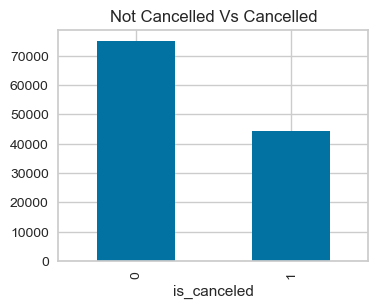

In [27]:
# Creating Bar chart as the Target variable is Categorical
GroupedData = df.groupby('is_canceled').size()
GroupedData.plot(kind='bar', figsize=(4,3), title='Not Cancelled Vs Cancelled');

## Visual Exploratory Data Analysis

    Categorical variables: Bar plot
    Continuous variables: Histogram

Visualize distribution of all the Categorical Predictor variables in the data using bar plots

In [28]:
# Plotting multiple bar charts at once for categorical variables
# Since there is no default function which can plot bar charts for multiple columns at once
# we are defining our own function for the same

def PlotBarCharts(inpData, colsToPlot):
    # Generating multiple subplots
    fig, subPlot=plt.subplots(nrows=1, ncols=len(colsToPlot), figsize=(20,5))
    fig.suptitle('Bar Charts of:'+ str(colsToPlot))
    
    for colName, plotNumber in zip(colsToPlot, range(len(colsToPlot))):
        inpData.groupby(colName).size().plot(kind='bar',ax=subPlot[plotNumber])

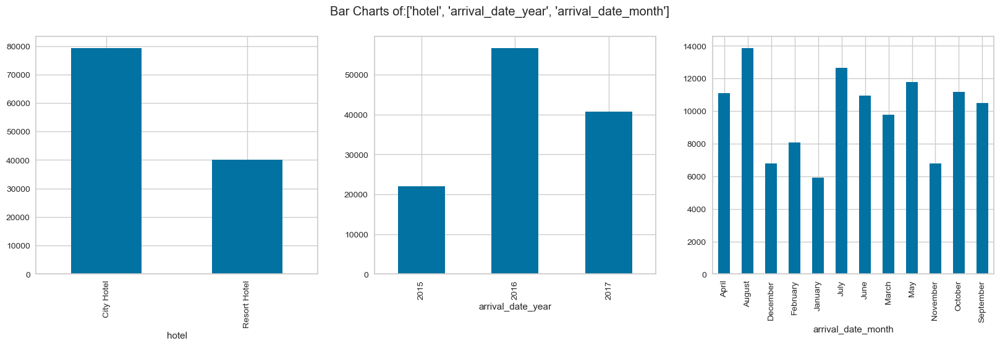

In [29]:
# # Calling the function
PlotBarCharts(inpData=df, colsToPlot=['hotel','arrival_date_year','arrival_date_month']);

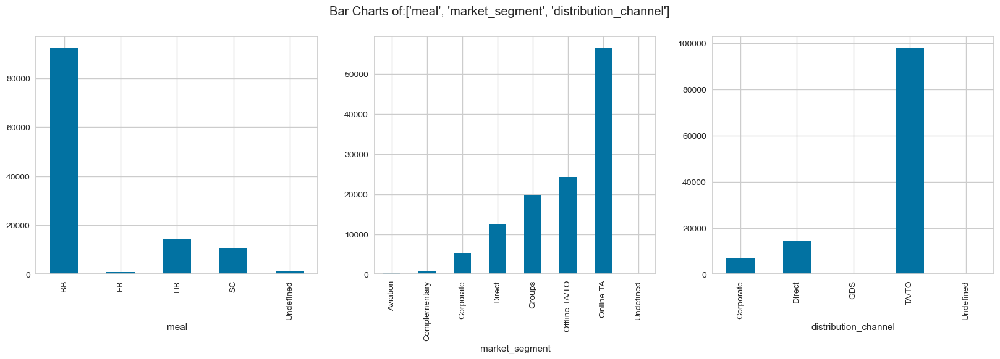

In [30]:
# # Calling the function
PlotBarCharts(inpData=df, colsToPlot=['meal','market_segment','distribution_channel'])

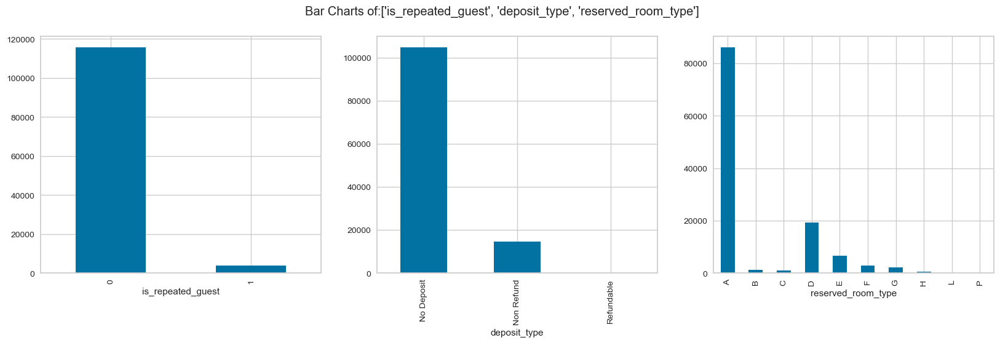

In [31]:
# # Calling the function
PlotBarCharts(inpData=df, colsToPlot=['is_repeated_guest','deposit_type','reserved_room_type'])

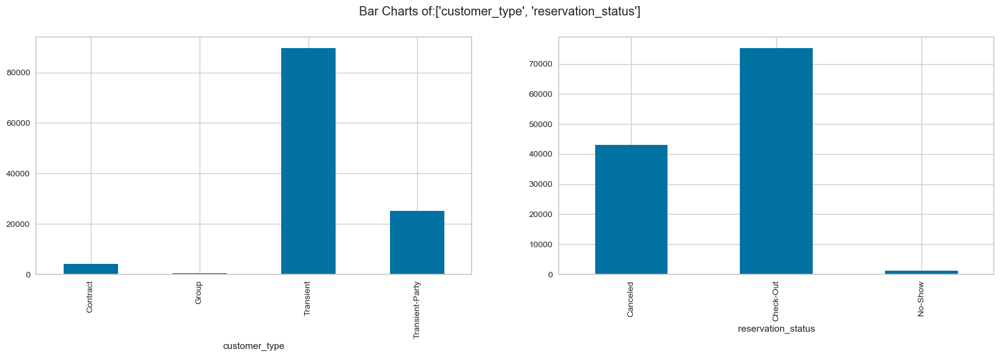

In [32]:
# # Calling the function
PlotBarCharts(inpData=df, colsToPlot=['customer_type','reservation_status'])

## Visualize distribution of all the Continuous Predictor variables in the data using histograms

Based on the Basic Data Exploration, there --- continuous predictor variables 

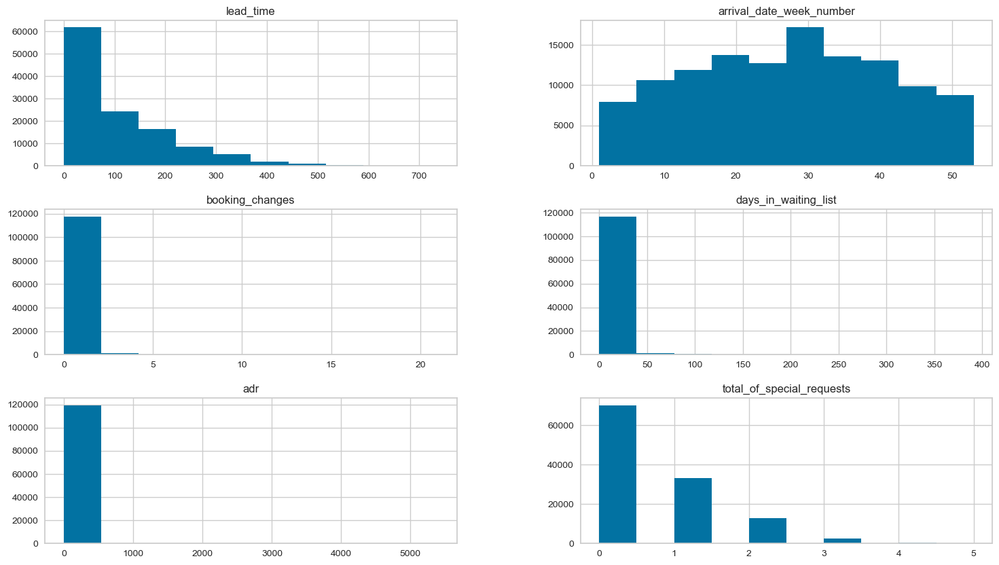

In [33]:
# # Plotting histograms of multiple columns together
df.hist(['lead_time','arrival_date_week_number','booking_changes','days_in_waiting_list',
         'adr','total_of_special_requests'], figsize=(18,10));

# Feature Selection

Now its time to finally choose the best columns(Features) which are correlated to the Target variable. This can be done directly by measuring the correlation values or ANOVA/Chi-Square tests. However, it is always helpful to visualize the relation between the Target variable and each of the predictors to get a better sense of data.

I have listed below the techniques used for visualizing relationship between two variables as well as measuring the strength statistically.

## Visual exploration of relationship between variables

    Continuous Vs Continuous ---- Scatter Plot
    Categorical Vs Continuous---- Box Plot
    Categorical Vs Categorical---- Grouped Bar Plots

## Statistical measurement of relationship strength between variables

    Continuous Vs Continuous ---- Correlation matrix
    Categorical Vs Continuous---- ANOVA test
    Categorical Vs Categorical--- Chi-Square test

In this case study the Target variable is Continuous, hence below two scenarios will be present

    Continuous Target Variable Vs Continuous Predictor
    Continuous Target Variable Vs Categorical Predictor

## Relationship exploration: Continuous Vs Continuous -- Box Plots

When the target variable is Categorical and the predictor variable is Continuous we analyze the relation using bar plots/Boxplots and measure the strength of relation using Anova test

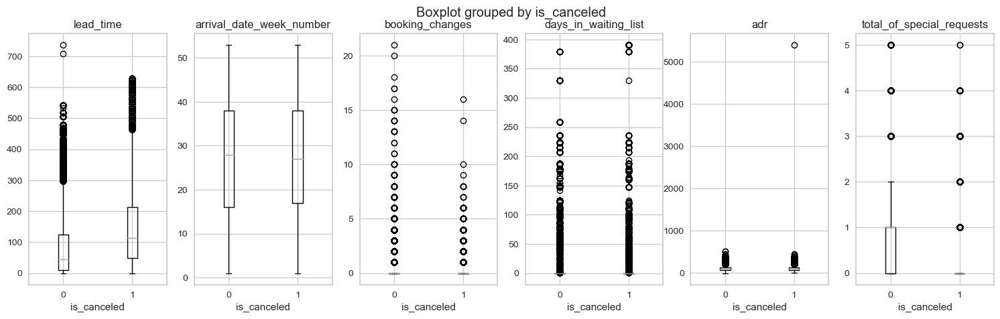

In [34]:
# Box plots for Categorical Target Variable 'is_canceled' and continuous predictors
ContinuousColsList = ['lead_time','arrival_date_week_number','booking_changes','days_in_waiting_list',
                      'adr','total_of_special_requests']

fig, PlotCanvas=plt.subplots(nrows=1, ncols=len(ContinuousColsList), figsize=(18,5))

# Creating box plots for each continuous predictor against the Target Variable 'Risk_Flag'
for PredictorCol, i in zip(ContinuousColsList, range(len(ContinuousColsList))):
    df.boxplot(column=PredictorCol, by='is_canceled', figsize=(5,5), vert=True, ax=PlotCanvas[i])

## Box-Plots interpretation

What should you look for in these box plots?

These plots gives an idea about the data distribution of continuous predictor in the Y-axis for each of the category in the X-Axis.

If the distribution looks similar for each category(Boxes are in the same line), that means the the continuous variable has NO effect on the target variable. Hence, the variables are not correlated to each other.

We confirm this by looking at the results of ANOVA test below

## Statistical Feature Selection (Categorical Vs Continuous) using ANOVA test

Analysis of variance(ANOVA) is performed to check if there is any relationship between the given continuous and categorical variable

    Assumption(H0): There is NO relation between the given variables (i.e. The average(mean) values of the numeric Target variable is same for all the groups in the categorical Predictor variable)
    ANOVA Test result: Probability of H0 being true

In [35]:
# Defining a function to find the statistical relationship with all the categorical variables
def FunctionAnova(inpData, TargetVariable, ContinuousPredictorList):
    # Creating an empty list of final selected predictors
    SelectedPredictors=[]
    
    print('##### ANOVA Results ##### \n')
    for predictor in ContinuousPredictorList:
        CategoryGroupLists=inpData.groupby(TargetVariable)[predictor].apply(list)
        AnovaResults = f_oneway(*CategoryGroupLists)
        
        # If the ANOVA P-Value is <0.05, that means we reject H0
        if (AnovaResults[1] < 0.05):
            print(predictor, 'is correlated with', TargetVariable, '| P-Value:', AnovaResults[1])
            SelectedPredictors.append(predictor)
        else:
            print(predictor, 'is NOT correlated with', TargetVariable, '| P-Value:', AnovaResults[1])
    return(SelectedPredictors)

In [36]:
# Calling the function to check which categorical variables are correlated with target
ContinuousVariables=['lead_time','arrival_date_week_number','booking_changes','days_in_waiting_list',
                      'adr','total_of_special_requests']
FunctionAnova(inpData=df, TargetVariable='is_canceled', ContinuousPredictorList=ContinuousVariables)

##### ANOVA Results ##### 

lead_time is correlated with is_canceled | P-Value: 0.0
arrival_date_week_number is correlated with is_canceled | P-Value: 0.0048715536408192
booking_changes is correlated with is_canceled | P-Value: 0.0
days_in_waiting_list is correlated with is_canceled | P-Value: 2.5035682688514107e-78
adr is correlated with is_canceled | P-Value: 9.682934180597534e-61
total_of_special_requests is correlated with is_canceled | P-Value: 0.0


['lead_time',
 'arrival_date_week_number',
 'booking_changes',
 'days_in_waiting_list',
 'adr',
 'total_of_special_requests']

The results of ANOVA confirm our visual analysis using box plots above.

All columns are correlated with 'is_canceled' (Target Variable)

## Relationship exploration: Categorical Vs Categorical -- Grouped Bar Charts

When the target variable is Categorical and the predictor is also Categorical then we explore the correlation between them visually using barplots and statistically using Chi-square test

In [40]:
CrossTabResult = pd.crosstab(df['arrival_date_year'], [df['hotel'], df['is_canceled']])
CrossTabResult

hotel             City Hotel        Resort Hotel      
is_canceled                0      1            0     1
arrival_date_year                                     
2015                    7678   6004         6176  2138
2016                   22733  15407        13637  4930
2017                   15817  11691         9125  4054

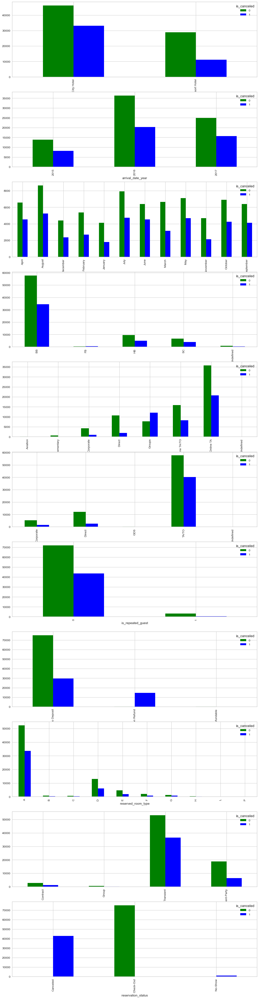

In [44]:
# Visual Inference using Grouped Bar charts
CategoricalColsList=['hotel','arrival_date_year','arrival_date_month',
                    'meal','market_segment','distribution_channel',
                    'is_repeated_guest','deposit_type','reserved_room_type',
                    'customer_type','reservation_status']

fig, PlotCanvas=plt.subplots(nrows=len(CategoricalColsList), ncols=1, figsize=(15,60))

# Creating Grouped bar plots for each categorical predictor against the Target Variable "Survived"
for CategoricalCol , i in zip(CategoricalColsList, range(len(CategoricalColsList))):
    CrossTabResult=pd.crosstab(index=df[CategoricalCol], columns=df['is_canceled'])
    CrossTabResult.plot.bar(color=['green','blue'], ax=PlotCanvas[i])

### Statistical Feature Selection (Categorical Vs Categorical) using Chi-Square Test

Chi-Square test is conducted to check the correlation between two categorical variables

    Assumption(H0): The two columns are NOT related to each other
    Result of Chi-Sq Test: The Probability of H0 being True
    More information on ChiSq: https://www.mathsisfun.com/data/chi-square-test.html

In [92]:
# Writing a function to find the correlation of all categorical variables with the Target variable

def FunctionChisq(inpData, TargetVariable, CategoricalVariablesList):
    from scipy.stats import chi2_contingency
    
    # Creating an empty list of final selected predictors
    SelectedPredictors=[]

    for predictor in CategoricalVariablesList:
        CrossTabResult=pd.crosstab(index=inpData[TargetVariable], columns=inpData[predictor])
        ChiSqResult = chi2_contingency(CrossTabResult)
        
        # If the ChiSq P-Value is < 0.05, that means we reject H0
        if (ChiSqResult[1] < 0.05):
            print(predictor, 'is correlated with', TargetVariable, '| P-Value:', ChiSqResult[1])
            SelectedPredictors.append(predictor)
        else:
            print(predictor, 'is NOT correlated with', TargetVariable, '| P-Value:', ChiSqResult[1])        
            
    return(SelectedPredictors)

In [104]:
CategoricalVariables=['hotel','arrival_date_year','arrival_date_month',
                    'meal','market_segment','distribution_channel',
                    'is_repeated_guest','deposit_type','reserved_room_type',
                    'customer_type','reservation_status','country']

# Calling the function
FunctionChisq(inpData=df, 
              TargetVariable='is_canceled',
              CategoricalVariablesList= CategoricalVariables)

hotel is correlated with is_canceled | P-Value: 0.0
arrival_date_year is correlated with is_canceled | P-Value: 1.8838184169537e-18
arrival_date_month is correlated with is_canceled | P-Value: 3.671822609327152e-119
meal is correlated with is_canceled | P-Value: 1.3212351959124216e-64
market_segment is correlated with is_canceled | P-Value: 0.0
distribution_channel is correlated with is_canceled | P-Value: 0.0
is_repeated_guest is correlated with is_canceled | P-Value: 1.7841252215934033e-188
deposit_type is correlated with is_canceled | P-Value: 0.0
reserved_room_type is correlated with is_canceled | P-Value: 1.121956218424043e-133
customer_type is correlated with is_canceled | P-Value: 0.0
reservation_status is correlated with is_canceled | P-Value: 0.0
country is correlated with is_canceled | P-Value: 0.0


['hotel',
 'arrival_date_year',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'is_repeated_guest',
 'deposit_type',
 'reserved_room_type',
 'customer_type',
 'reservation_status',
 'country']

# Selecting final predictors for Machine Learning

Based on the above tests, selecting the final columns for machine learning

In [9]:
SelectedColumns = ['lead_time','arrival_date_week_number','booking_changes','days_in_waiting_list',
                      'adr','total_of_special_requests','hotel','arrival_date_year','arrival_date_month',
                    'meal','market_segment','distribution_channel',
                    'is_repeated_guest','deposit_type','reserved_room_type',
                    'customer_type','reservation_status','country']
# Selecting final columns
DataForML = df[SelectedColumns]
DataForML.head()

,lead_time,arrival_date_week_number,booking_changes,days_in_waiting_list,adr,total_of_special_requests,hotel,arrival_date_year,arrival_date_month,meal,market_segment,distribution_channel,is_repeated_guest,deposit_type,reserved_room_type,customer_type,reservation_status,country
0,342,27,3,0,0.00,0,Resort Hotel,2015,July,BB,Direct,Direct,0,No Deposit,C,Transient,Check-Out,PRT
1,737,27,4,0,0.00,0,Resort Hotel,2015,July,BB,Direct,Direct,0,No Deposit,C,Transient,Check-Out,PRT
2,7,27,0,0,75.00,0,Resort Hotel,2015,July,BB,Direct,Direct,0,No Deposit,A,Transient,Check-Out,GBR
3,13,27,0,0,75.00,0,Resort Hotel,2015,July,BB,Corporate,Corporate,0,No Deposit,A,Transient,Check-Out,GBR
4,14,27,0,0,98.00,1,Resort Hotel,2015,July,BB,Online TA,TA/TO,0,No Deposit,A,Transient,Check-Out,GBR


In [10]:
# Encoding Categorical variables into numerical variables

# Select the categorical columns
cat_data = ['hotel','arrival_date_year','arrival_date_month',
           'meal','market_segment','distribution_channel','deposit_type','reserved_room_type',
            'customer_type','reservation_status','country']

# Define the encoder
encoder = ce.OrdinalEncoder(cols=cat_data, return_df=True)

# Fit and transform the encoder on the entire dataset
encoded_cat_data = encoder.fit_transform(df)

In [11]:
# Making these changes permanent
df[cat_data] = encoded_cat_data[cat_data]

In [12]:
# Making these changes permanent
df[cat_data] = encoded_cat_data[cat_data]

In [13]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,meal,country,market_segment,...,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,total_of_special_requests,reservation_status
0,1,0,342,1,1,27,1,1,1,1,...,0,0,1,3,1,0,1,0.00,0,1
1,1,0,737,1,1,27,1,1,1,1,...,0,0,1,4,1,0,1,0.00,0,1
2,1,0,7,1,1,27,1,1,2,1,...,0,0,2,0,1,0,1,75.00,0,1
3,1,0,13,1,1,27,1,1,2,2,...,0,0,2,0,1,0,1,75.00,0,1
4,1,0,14,1,1,27,1,1,2,3,...,0,0,2,0,1,0,1,98.00,1,1


In [14]:
# Separate Target Variable and Predictor Variables
TargetVariable = 'is_canceled'
Predictors = ['lead_time','arrival_date_week_number','booking_changes','days_in_waiting_list',
                      'adr','total_of_special_requests','hotel','arrival_date_year','arrival_date_month',
                    'meal','market_segment','distribution_channel',
                    'is_repeated_guest','deposit_type','reserved_room_type',
                    'customer_type','reservation_status','country']
print(TargetVariable, Predictors)

is_canceled ['lead_time', 'arrival_date_week_number', 'booking_changes', 'days_in_waiting_list', 'adr', 'total_of_special_requests', 'hotel', 'arrival_date_year', 'arrival_date_month', 'meal', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'deposit_type', 'reserved_room_type', 'customer_type', 'reservation_status', 'country']


In [15]:
X = df.drop(['is_canceled'], axis=1)
y = df['is_canceled']

print(X,y)

        hotel  lead_time  arrival_date_year  arrival_date_month  \
0           1        342                  1                   1   
1           1        737                  1                   1   
2           1          7                  1                   1   
3           1         13                  1                   1   
4           1         14                  1                   1   
...       ...        ...                ...                 ...   
119385      2         23                  3                   2   
119386      2        102                  3                   2   
119387      2         34                  3                   2   
119388      2        109                  3                   2   
119389      2        205                  3                   2   

        arrival_date_week_number  arrival_date_day_of_month  meal  country  \
0                             27                          1     1        1   
1                             27       

In [16]:
X.shape, y.shape

((119390, 21), (119390,))

##### Split the data into training and testing set

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [18]:
# Display the rows and columns (dimensions) of an unsplitted dataset
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

# Display the rows and columns (dimensions) of the splitted dataset
print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Total number of rows and columns for the complete dataset:  (119390, 21) (119390,)
Number of rows and columns after splitting dataset:  (83573, 21) (35817, 21) (83573,) (35817,)


## Standardization/Normalization of data

You can choose not to run this step if you want to compare the resultant accuracy of this transformation with the accuracy of raw data.

However, if you are using KNN or Neural Networks, then this step becomes necessary.

In [19]:
# select the continuous numerical variables
cont_num_var = ['lead_time','arrival_date_week_number','booking_changes','days_in_waiting_list',
                      'adr','total_of_special_requests','is_repeated_guest']

# Instantiate the MinMaxScaler 
scaler = MinMaxScaler()

# Normalize the continuous numerical variables
X_train[cont_num_var] = scaler.fit_transform(X_train[cont_num_var])

X_test[cont_num_var] = scaler.transform(X_test[cont_num_var])

In [20]:
print(X_train.head())
print(X_train.describe())

        hotel  lead_time  arrival_date_year  arrival_date_month  \
9710        1       0.17                  2                   6   
40307       2       0.03                  1                   1   
110051      2       0.12                  3                  10   
22999       1       0.00                  3                   8   
8344        1       0.06                  2                   3   

        arrival_date_week_number  arrival_date_day_of_month  meal  country  \
9710                        1.00                         27     1        6   
40307                       0.56                         22     1        1   
110051                      0.29                         16     1       14   
22999                       0.08                          2     1        1   
8344                        0.73                         23     1        5   

        market_segment  distribution_channel  ...  previous_cancellations  \
9710                 3                     3  ...  

In [21]:
print(X_test.head())
print(X_test.describe())

        hotel  lead_time  arrival_date_year  arrival_date_month  \
30946       1       0.28                  2                   6   
40207       2       0.11                  1                   1   
103708      2       0.03                  2                   6   
85144       2       0.00                  2                   9   
109991      2       0.09                  3                  10   

        arrival_date_week_number  arrival_date_day_of_month  meal  country  \
30946                       0.92                          2     1        2   
40207                       0.54                         16     1        1   
103708                      1.00                         27     1       26   
85144                       0.19                          9     1       22   
109991                      0.29                         16     4        2   

        market_segment  distribution_channel  ...  previous_cancellations  \
30946                1                     1  ...  

# Logistic Regression

In [27]:
# Logistic Regression
# choose parameter Penalty='l1' or C=1
# choose different values for solver 'newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'
clf = LogisticRegression(C=1,penalty='l2', solver='newton-cg')

# Printing all the parameters of logistic regression
print(clf)

LogisticRegression(C=1, solver='newton-cg')


In [28]:
# Creating the model on Training Data
LOG = clf.fit(X_train,y_train)
prediction = LOG.predict(X_test)

In [29]:
# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     22478
           1       1.00      1.00      1.00     13339

    accuracy                           1.00     35817
   macro avg       1.00      1.00      1.00     35817
weighted avg       1.00      1.00      1.00     35817



In [30]:
print('LOG Test Score:',LOG.score(X_test,y_test))

LOG Test Score: 1.0


## Confusion Matrix

In [31]:
LOG.classes_

array([0, 1], dtype=int64)

In [32]:
mapping = {0:'Not Canceled', 1:'Canceled'}
classesMapped = [mapping.get(value, value) for value in clf.classes_]
classesMapped

['Not Canceled', 'Canceled']

In [33]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[22478     0]
 [    0 13339]]


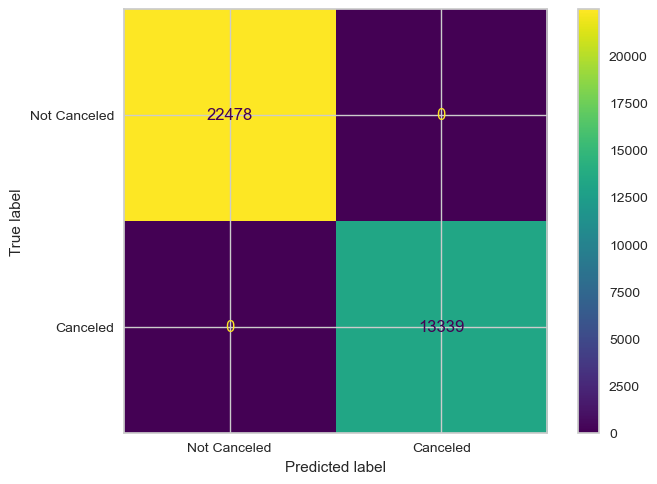

In [141]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [142]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 1.0


In [143]:
# Running 10-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(LOG, X , y, cv=10, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [1.         1.         1.         1.         0.99991624 1.
 1.         1.         1.         1.        ]

Final Average Accuracy of the model: 1.0


In [144]:
# 'LogisticRegression' object has no attribute 'feature_importances_'

# Decision Tree

In [145]:
#Decision Trees
#choose from different tunable hyper parameters
clf = tree.DecisionTreeClassifier(max_depth=2,criterion='entropy')

# Printing all the parameters of Decision Trees
print(clf)

DecisionTreeClassifier(criterion='entropy', max_depth=2)


In [146]:
# Creating the model on Training Data
DTree=clf.fit(X_train,y_train)
prediction=DTree.predict(X_test)

# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     22478
           1       1.00      1.00      1.00     13339

    accuracy                           1.00     35817
   macro avg       1.00      1.00      1.00     35817
weighted avg       1.00      1.00      1.00     35817



In [147]:
print('DT Test Score:',DTree.score(X_test,y_test))

DT Test Score: 1.0


## Confusion Matrix

In [149]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[22478     0]
 [    0 13339]]


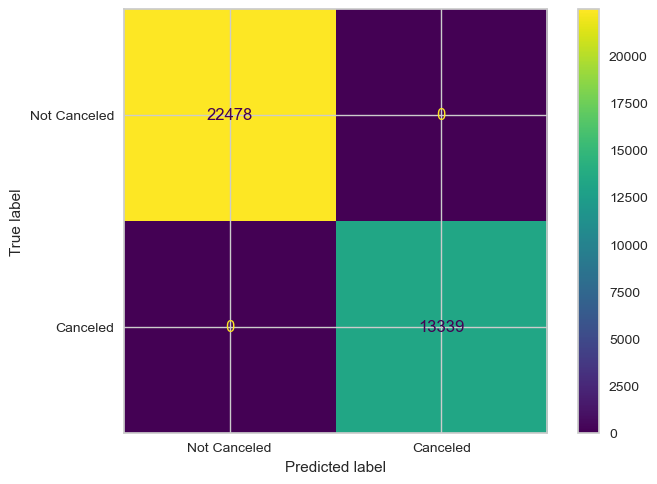

In [150]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [151]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 1.0


In [152]:
# Running 5-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(DTree, X , y, cv=5, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [1. 1. 1. 1. 1.]

Final Average Accuracy of the model: 1.0


## Plot Feature Importances

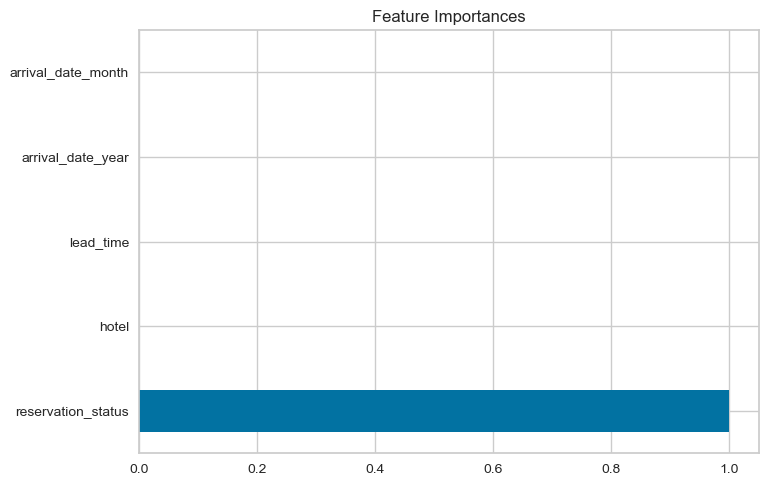

In [167]:
# Plotting the feature importance for Top 5 most important columns
feature_importances = pd.Series(DTree.feature_importances_, index=X.columns)
feature_importances.nlargest(5).plot(kind='barh', title = 'Feature Importances', grid=True);

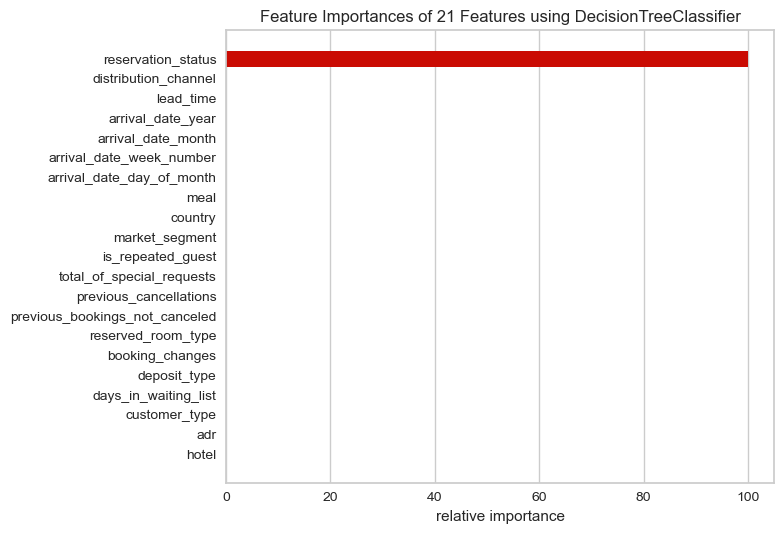

In [161]:
viz = FeatureImportances(clf, labels=X.columns)
viz.fit(X_train, y_train)
viz.show();

# Random Forest

In [174]:
# Random Forest (Bagging of multiple Decision Trees)
clf = RandomForestClassifier(max_depth=2, n_estimators=100,criterion='gini')

# Printing all the parameters of Random Forest
print(clf)

RandomForestClassifier(max_depth=2)


In [175]:
# Creating the model on Training Data
RF=clf.fit(X_train,y_train)
prediction=RF.predict(X_test)

In [176]:
# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     22478
           1       1.00      1.00      1.00     13339

    accuracy                           1.00     35817
   macro avg       1.00      1.00      1.00     35817
weighted avg       1.00      1.00      1.00     35817



In [177]:
print('RF Test Score:',RF.score(X_test,y_test))

RF Test Score: 1.0


## Confusion Matrix

In [178]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[22478     0]
 [    0 13339]]


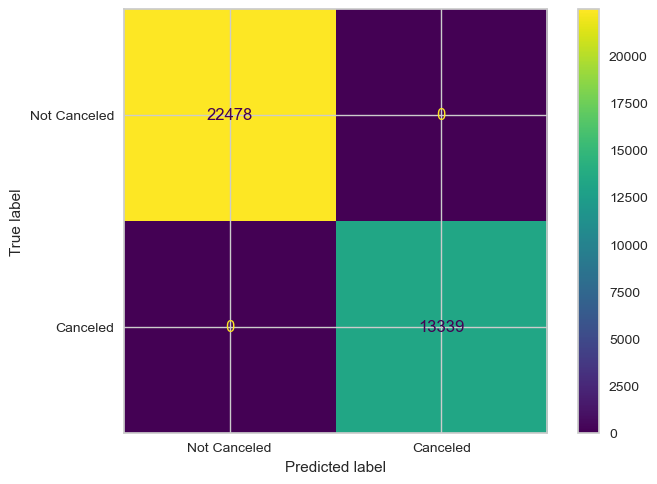

In [179]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [180]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 1.0


In [181]:
# Running 5-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(RF, X , y, cv=5, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.92238635 0.99928791 1.         0.99970682 0.99349663]

Final Average Accuracy of the model: 0.98


## Plot Feature Importances

<AxesSubplot:title={'center':'Feature Importances'}>

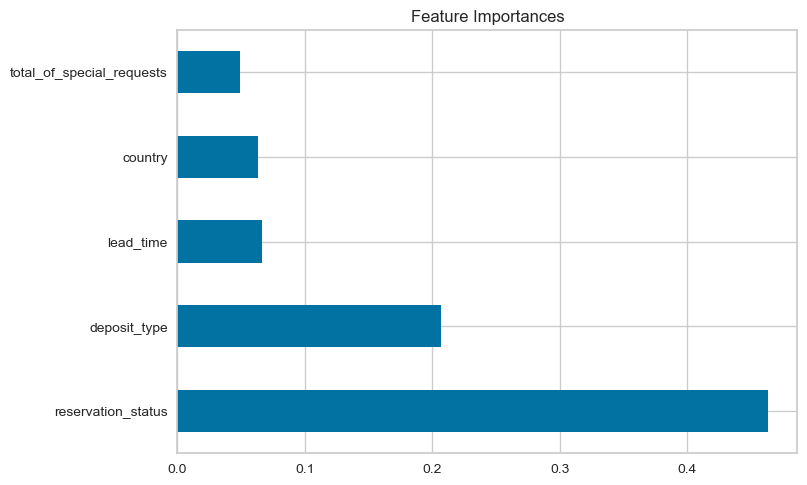

In [182]:
# Plotting the feature importance for Top 5 most important columns
feature_importances = pd.Series(RF.feature_importances_, index=X.columns)
feature_importances.nlargest().plot(kind='barh', title = 'Feature Importances', grid=True)

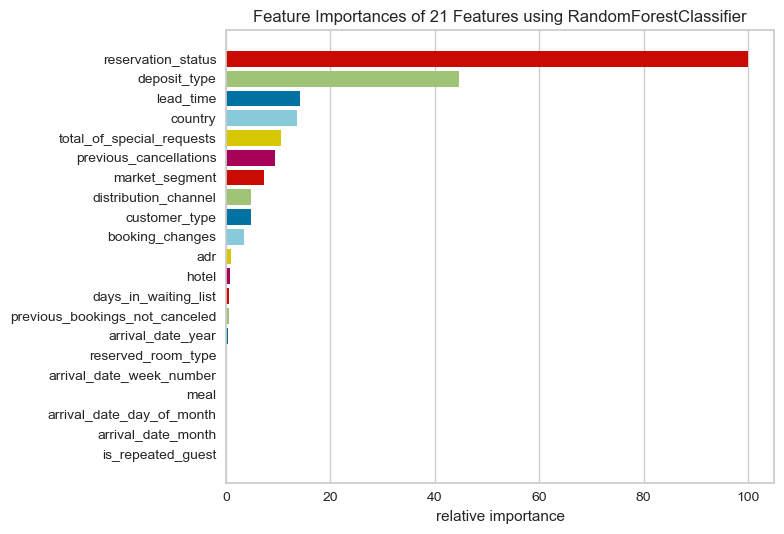

In [183]:
viz = FeatureImportances(clf, labels=X.columns)
viz.fit(X_train, y_train)
viz.show();

## Plotting one of the Decision Trees in the Random Forest

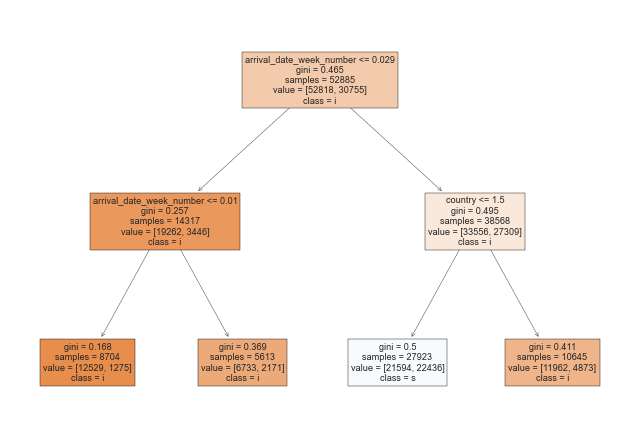

In [188]:
tree.plot_tree(clf.estimators_[3], filled=True,feature_names=Predictors, class_names=TargetVariable);

# AdaBoost

In [217]:
# Choosing Decision Tree with 1 level as the weak learner
DTC=DecisionTreeClassifier(max_depth=1)
clf = AdaBoostClassifier(n_estimators=500, base_estimator=DTC ,learning_rate=0.01)

# Printing all the parameters of Adaboost
print(clf)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1),
                   learning_rate=0.01, n_estimators=500)


In [218]:
# Creating the model on Training Data
AB=clf.fit(X_train,y_train)
prediction=AB.predict(X_test)

# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     22478
           1       1.00      1.00      1.00     13339

    accuracy                           1.00     35817
   macro avg       1.00      1.00      1.00     35817
weighted avg       1.00      1.00      1.00     35817



In [198]:
print('AB Test Score:',AB.score(X_test,y_test))

AB Test Score: 1.0


## Confusion Matrix

In [199]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[22478     0]
 [    0 13339]]


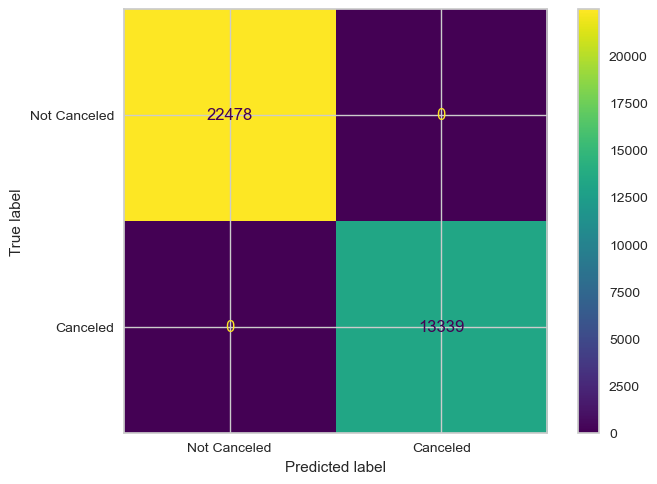

In [200]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [202]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 1.0


In [203]:
# Running 5-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(AB, X , y, cv=5, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [1. 1. 1. 1. 1.]

Final Average Accuracy of the model: 1.0


## Plot Feature Importances

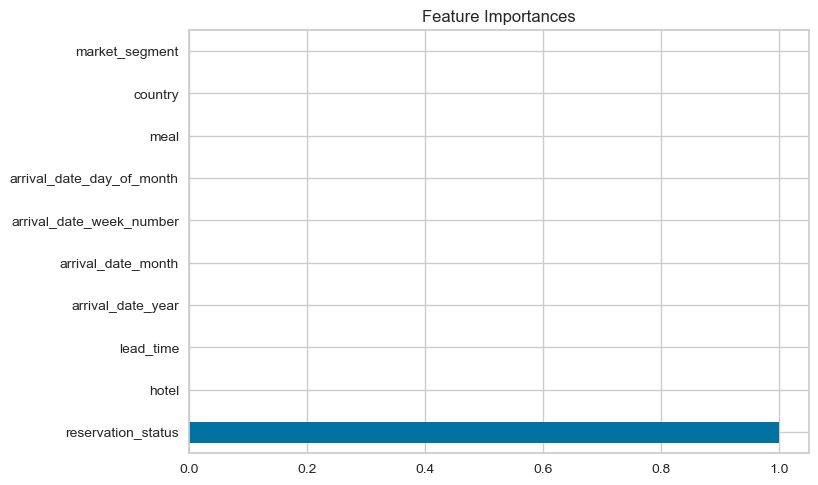

In [204]:
# Plotting the feature importance for Top 10 most important columns
feature_importances = pd.Series(AB.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh', title = 'Feature Importances', grid=True);

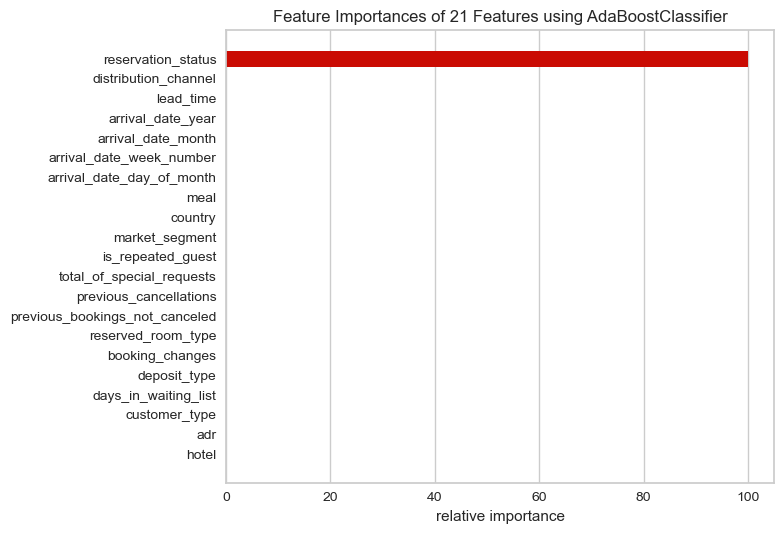

In [207]:
viz = FeatureImportances(clf, labels=X.columns)
viz.fit(X_train, y_train)
viz.show();

## Plot One Tree

In [225]:
# tree.plot_tree(clf.estimators_[0], filled=True,feature_names=Predictors, class_names=TargetVariable);
# #IndexError: list index out of range

# KNN

In [226]:
# K-Nearest Neighbor(KNN)
clf = KNeighborsClassifier(n_neighbors=3)

# Printing all the parameters of KNN
print(clf)

KNeighborsClassifier(n_neighbors=3)


In [227]:
# Creating the model on Training Data
KNN=clf.fit(X_train,y_train)
prediction=KNN.predict(X_test)

# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95     22478
           1       0.94      0.89      0.91     13339

    accuracy                           0.94     35817
   macro avg       0.94      0.93      0.93     35817
weighted avg       0.94      0.94      0.94     35817



In [228]:
print('KNN Test Score:',KNN.score(X_test,y_test))

KNN Test Score: 0.9362034787949857


## Confusion Matrix

In [229]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[21714   764]
 [ 1521 11818]]


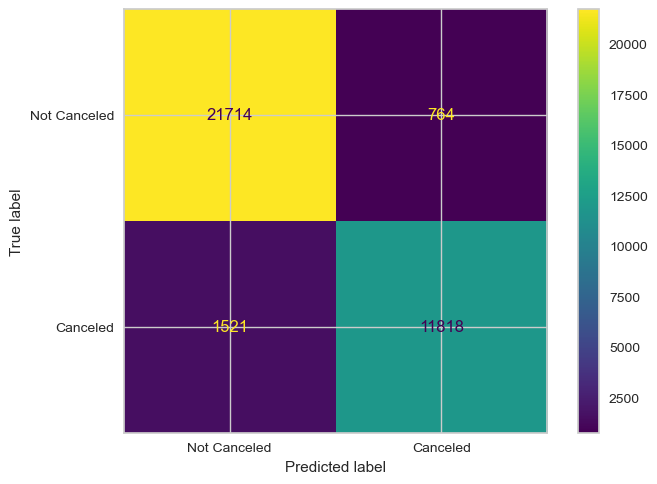

In [230]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [231]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 0.94


In [232]:
# Running 5-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(KNN, X , y, cv=5, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.57895985 0.56381384 0.50885607 0.47122857 0.49098685]

Final Average Accuracy of the model: 0.52


In [ ]:
# 'KNeighborsClassifier' object has no attribute 'feature_importances_'
# YellowbrickTypeError: could not find feature importances param on KNeighborsClassifier

# SVM

   Computational cost 

In [233]:
# # Support Vector Machines(SVM)
# clf = svm.SVC(C=3, kernel='rbf', gamma=0.1)

# # Printing all the parameters of KNN
# print(clf)

SVC(C=3, gamma=0.1)


In [ ]:
# # Creating the model on Training Data
# SVM=clf.fit(X_train,y_train)
# prediction=SVM.predict(X_test)

# # Measuring accuracy on Testing Data
# print(metrics.classification_report(y_test, prediction))

In [ ]:
# print('SVM Test Score:',SVM.score(X_test,y_test))

# Naive Bayes

In [22]:
# Naive Bayes
# GaussianNB is used in Binomial Classification
# MultinomialNB is used in multi-class classification
clf = GaussianNB()
#clf = MultinomialNB()

# Printing all the parameters of Naive Bayes
print(clf)

GaussianNB()


In [23]:
NB=clf.fit(X_train,y_train)
prediction=NB.predict(X_test)

# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     22478
           1       0.99      1.00      0.99     13339

    accuracy                           1.00     35817
   macro avg       0.99      1.00      1.00     35817
weighted avg       1.00      1.00      1.00     35817



In [24]:
print('NB Test Score:',NB.score(X_test,y_test))

NB Test Score: 0.9960912415891895


## Confusion Matrix

In [25]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[22338   140]
 [    0 13339]]


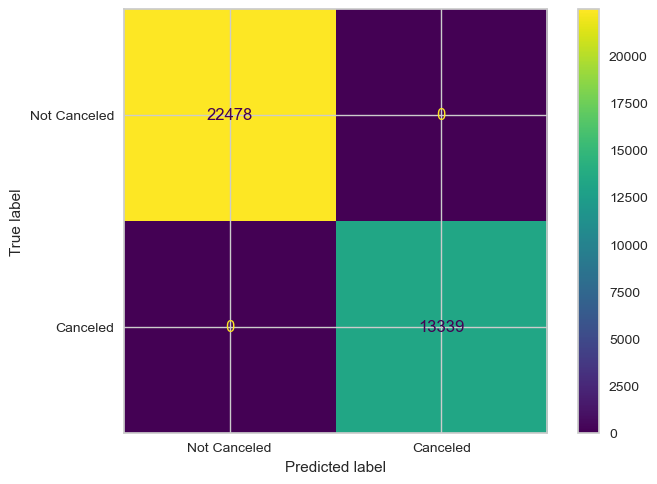

In [34]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [35]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 1.0


In [36]:
# Running 5-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(NB, X , y, cv=5, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.99293584 0.99903703 0.98178427 0.99694535 0.99991624]

Final Average Accuracy of the model: 0.99


In [ ]:
# 'GaussianNB' object has no attribute 'feature_importances_'
# YellowbrickTypeError: could not find feature importances param on GaussianNB

# Passive Aggressive Classifier

In [42]:
print('PAC Test Score:',PAC.score(X_test,y_test))

PAC Test Score: 1.0


In [47]:
clf = PassiveAggressiveClassifier(C = 0.5, random_state = 5)

# Printing all the parameters of PAC
print(clf)

PassiveAggressiveClassifier(C=0.5, random_state=5)


In [48]:
# Creating the model on resampled Training Data
PAC=clf.fit(X_train, y_train)
y_pred=PAC.predict(X_test)

In [49]:
# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     22478
           1       1.00      1.00      1.00     13339

    accuracy                           1.00     35817
   macro avg       1.00      1.00      1.00     35817
weighted avg       1.00      1.00      1.00     35817



In [50]:
print('PAC Test Score:',PAC.score(X_test,y_test))

PAC Test Score: 1.0


## Confusion Matrix

In [51]:
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[22478     0]
 [    0 13339]]


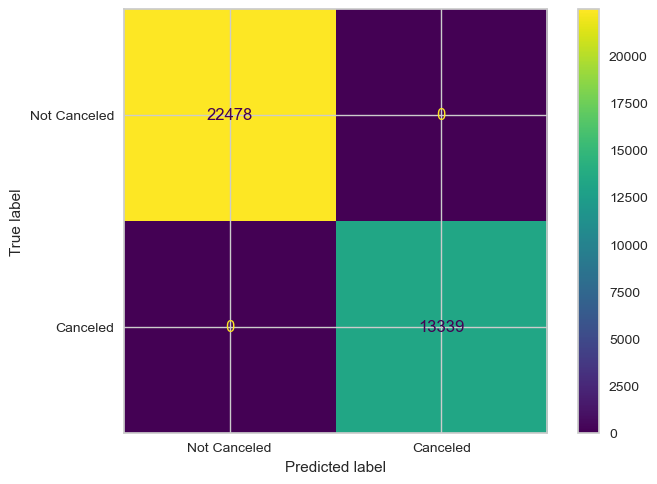

In [52]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [54]:
# Printing the Overall Accuracy of the model
F1_Score=metrics.f1_score(y_test, prediction, average='weighted')
print('Accuracy of the model on Testing Sample Data:', round(F1_Score,2))

Accuracy of the model on Testing Sample Data: 1.0


In [53]:
# Running 5-Fold Cross validation on a given algorithm
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(PAC, X , y, cv=5, scoring='f1_weighted')
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))


Accuracy values for 10-fold Cross Validation:
 [0.99995812 0.99995812 0.99891146 0.99953927 0.99945548]

Final Average Accuracy of the model: 1.0


## Plot Feature Importances

In [57]:
# AttributeError: 'PassiveAggressiveClassifier' object has no attribute 'feature_importances_'

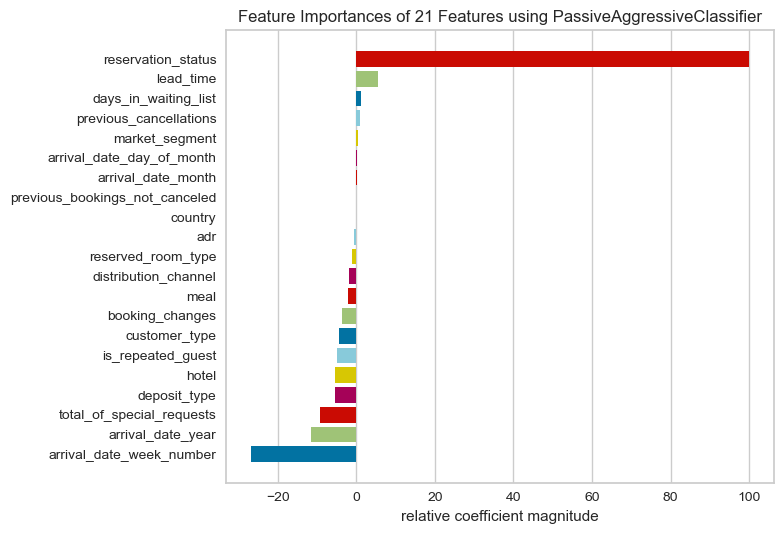

In [55]:
viz = FeatureImportances(clf, labels=X.columns)
viz.fit(X_train, y_train)
viz.show();

# Collect Model Data

In [70]:
models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'AdaBoost',
         'KNN','Naive Bayes', 'Passive Aggressive Classifier']

scores = [1.0000,1.0000,1.0000,1.0000,0.9362,1.0000,1.0000,] 

# Alogorithim Comparison

In [73]:
modelComparison = pd.DataFrame()

modelComparison['Test Score'] = scores
modelComparison.index = models
modelComparison

,Test Score
Logistic Regression,1.0000
Decision Tree,1.0000
Random Forest,1.0000
AdaBoost,1.0000
KNN,0.9362
Naive Bayes,1.0000
Passive Aggressive Classifier,1.0000


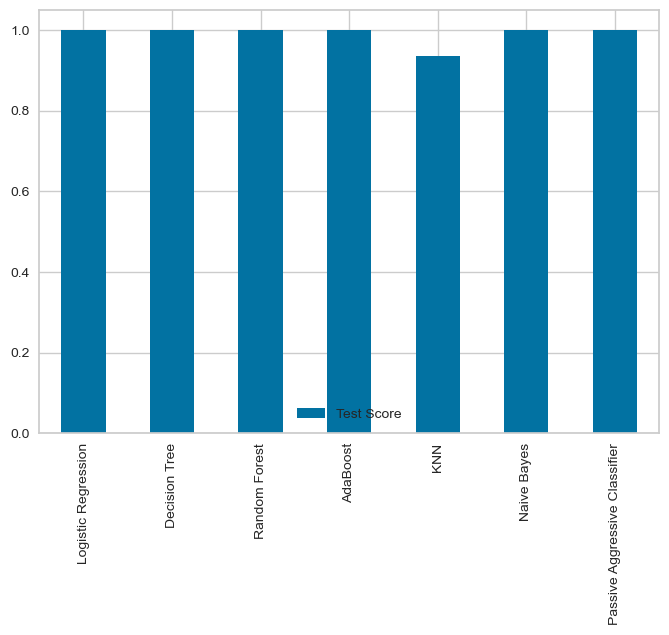

In [74]:
modelComparison.plot(kind='bar');

https://www.kaggle.com/datasets/mojtaba142/hotel-booking